# DEAM Dataset - Exploratory Data Analysis

# Done on local computer

## Import relevant libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

import seaborn as sns

import os

import sys
sys.path.insert(1, '../../utils')
from paths import *

## Import static annotations dataset

In [2]:
df_deam_static_annotations = pd.read_csv(get_deam_path('processed/annotations/deam_static_annotations.csv'))
df_deam_static_annotations

,song_id,valence_mean,valence_std,arousal_mean,arousal_std,valence_mean_mapped,arousal_mean_mapped
0,2,3.1,0.94,3.0,0.63,-0.475,-0.500
1,3,3.5,1.75,3.3,1.62,-0.375,-0.425
2,4,5.7,1.42,5.5,1.63,0.175,0.125
3,5,4.4,2.01,5.3,1.85,-0.150,0.075
4,7,5.8,1.47,6.4,1.69,0.200,0.350
...,...,...,...,...,...,...,...
1739,1996,3.9,1.87,5.9,2.21,-0.275,0.225
1740,1997,5.3,1.42,3.9,1.14,0.075,-0.275
1741,1998,6.4,1.50,6.2,1.60,0.350,0.300
1742,1999,4.6,2.11,5.4,1.80,-0.100,0.100


## Visualise the valence and arousal of 2013 and 2014 songs (1744 songs)

Text(0.5, 1.0, 'Scatter Plot of Static Arousal vs Static Valence')

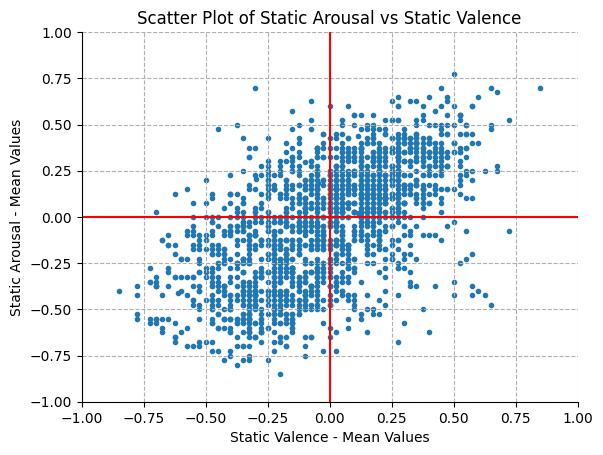

In [3]:
plt.scatter(df_deam_static_annotations['valence_mean_mapped'], \
            df_deam_static_annotations['arousal_mean_mapped'], \
            marker=".")

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_position(("data", -1))
plt.gca().spines["bottom"].set_position(("data", -1))

# since the values in the annotations range from 1 to 9
plt.gca().set_xlim([-1, 1])
plt.gca().set_ylim([-1, 1])
plt.axhline(0, color='red')
plt.axvline(0, color='red')
plt.grid(True, linestyle='--')
plt.xlabel("Static Valence - Mean Values")
plt.ylabel("Static Arousal - Mean Values")
plt.title('Scatter Plot of Static Arousal vs Static Valence')

Segment songs into their respective quadrants on the valence-arousal plot based on their static valence and arousal values

In [4]:
def segment_quadrant(s):
    if (s["valence_mean_mapped"] >= 0) and (s["arousal_mean_mapped"] >= 0):
        return 1
    elif (s["valence_mean_mapped"] < 0) and (s["arousal_mean_mapped"] >= 0):
        return 2
    elif (s["valence_mean_mapped"] < 0) and (s["arousal_mean_mapped"] < 0):
        return 3
    elif (s["valence_mean_mapped"] >= 0) and (s["arousal_mean_mapped"] < 0):
        return 4

df_deam_static_annotations['class'] = df_deam_static_annotations.apply(segment_quadrant, axis=1)
df_deam_static_annotations

,song_id,valence_mean,valence_std,arousal_mean,arousal_std,valence_mean_mapped,arousal_mean_mapped,class
0,2,3.1,0.94,3.0,0.63,-0.475,-0.500,3
1,3,3.5,1.75,3.3,1.62,-0.375,-0.425,3
2,4,5.7,1.42,5.5,1.63,0.175,0.125,1
3,5,4.4,2.01,5.3,1.85,-0.150,0.075,2
4,7,5.8,1.47,6.4,1.69,0.200,0.350,1
...,...,...,...,...,...,...,...,...
1739,1996,3.9,1.87,5.9,2.21,-0.275,0.225,2
1740,1997,5.3,1.42,3.9,1.14,0.075,-0.275,4
1741,1998,6.4,1.50,6.2,1.60,0.350,0.300,1
1742,1999,4.6,2.11,5.4,1.80,-0.100,0.100,2


Text(0.5, 1.0, 'Scatter Plot of Static Arousal vs Static Valence')

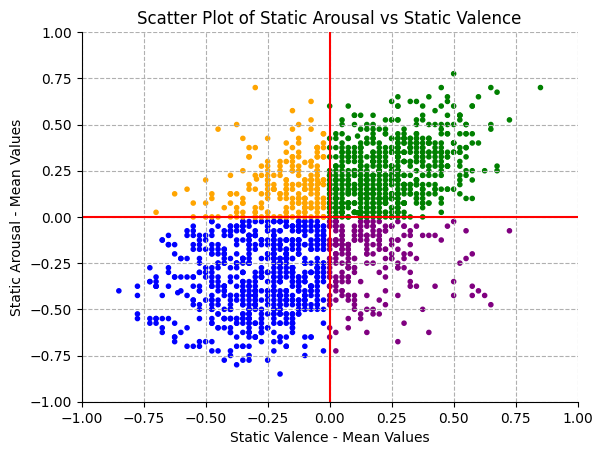

In [5]:
colors_map = {1: "green", 2: "orange", 3: "blue", 4:"purple"}

plt.scatter(df_deam_static_annotations["valence_mean_mapped"], \
            df_deam_static_annotations["arousal_mean_mapped"], \
            color=[colors_map[name] for name in df_deam_static_annotations['class']],
            marker=".")

plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.gca().spines["left"].set_position(("data", -1))
plt.gca().spines["bottom"].set_position(("data", -1))

# since the values in the annotations range from 1 to 9
plt.gca().set_xlim([-1, 1])
plt.gca().set_ylim([-1, 1])
plt.axhline(0, color='red')
plt.axvline(0, color='red')
plt.grid(True, linestyle='--')
plt.xlabel("Static Valence - Mean Values")
plt.ylabel("Static Arousal - Mean Values")
plt.title('Scatter Plot of Static Arousal vs Static Valence')

## Import openSMILE features datasets

In [6]:
df_deam_opensmile_compare2016_features = pd.read_csv(get_deam_path('processed/features/opensmile_compare2016_features.csv'))
df_deam_opensmile_emobase_features = pd.read_csv(get_deam_path('processed/features/opensmile_emobase_features.csv'))
df_deam_opensmile_gemaps_features = pd.read_csv(get_deam_path('processed/features/opensmile_gemaps_features.csv'))
df_deam_opensmile_egemaps_features = pd.read_csv(get_deam_path('processed/features/opensmile_egemaps_features.csv'))

# drop Unnamed:0 column
df_deam_opensmile_compare2016_features = df_deam_opensmile_compare2016_features[df_deam_opensmile_compare2016_features.columns[1:]]
df_deam_opensmile_emobase_features = df_deam_opensmile_emobase_features[df_deam_opensmile_emobase_features.columns[1:]]
df_deam_opensmile_gemaps_features = df_deam_opensmile_gemaps_features[df_deam_opensmile_gemaps_features.columns[1:]]
df_deam_opensmile_egemaps_features = df_deam_opensmile_egemaps_features[df_deam_opensmile_egemaps_features.columns[1:]]

df_deam_opensmile_compare2016_features

,song_id,audspec_lengthL1norm_sma_range,audspec_lengthL1norm_sma_maxPos,audspec_lengthL1norm_sma_minPos,audspec_lengthL1norm_sma_quartile1,audspec_lengthL1norm_sma_quartile2,audspec_lengthL1norm_sma_quartile3,audspec_lengthL1norm_sma_iqr1-2,audspec_lengthL1norm_sma_iqr2-3,audspec_lengthL1norm_sma_iqr1-3,...,mfcc_sma_de[14]_peakRangeAbs,mfcc_sma_de[14]_peakRangeRel,mfcc_sma_de[14]_peakMeanAbs,mfcc_sma_de[14]_peakMeanMeanDist,mfcc_sma_de[14]_peakMeanRel,mfcc_sma_de[14]_minRangeRel,mfcc_sma_de[14]_meanRisingSlope,mfcc_sma_de[14]_stddevRisingSlope,mfcc_sma_de[14]_meanFallingSlope,mfcc_sma_de[14]_stddevFallingSlope
0,2,4.487072,0.499444,0.000000,1.693069,2.279854,2.647825,0.586785,0.367970,0.954755,...,7.324224,0.534654,2.096779,2.095753,20.000000,0.647608,100.58043,50.135098,99.799490,49.985157
1,3,2.939642,0.417260,0.000000,0.935776,1.065326,1.215337,0.129550,0.150011,0.279561,...,6.627462,0.489874,1.832508,1.833608,-19.999998,0.570708,80.85080,43.208675,80.717380,45.814630
2,4,4.937490,0.786922,0.000000,2.454838,2.963577,3.478416,0.508740,0.514839,1.023579,...,8.150249,0.506702,2.152296,2.151656,20.000000,0.624459,96.52063,51.825253,92.622505,45.681725
3,5,5.179635,0.450400,0.000000,1.997853,2.568133,3.278233,0.570280,0.710101,1.280380,...,7.644168,0.486110,2.054498,2.052557,19.999930,0.592607,89.58958,48.105022,85.724660,47.280334
4,7,3.889954,0.151812,0.000000,1.453349,1.739884,2.153651,0.286535,0.413767,0.700302,...,7.221351,0.562967,1.721128,1.722401,-19.999989,0.591437,80.62400,39.327477,79.446900,39.143200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,1.748674,0.459159,0.705987,2.456600,2.611855,2.864886,0.155254,0.253031,0.408286,...,7.014015,0.592036,1.998147,1.996065,19.999868,0.566083,93.15075,44.501705,96.057270,44.310146
1740,1997,1.770800,0.082795,0.178277,1.684116,1.875371,2.086306,0.191255,0.210935,0.402190,...,8.635638,0.530015,2.202010,2.199063,19.999430,0.565890,101.92789,55.691982,102.434510,54.795270
1741,1998,3.346390,0.490318,0.120855,2.030153,2.356498,2.708012,0.326345,0.351515,0.677860,...,7.182379,0.635415,1.889074,1.887913,19.999996,0.551982,86.53014,42.108500,89.627280,44.030266
1742,1999,3.149409,0.754730,0.432228,1.714522,1.995686,2.405440,0.281164,0.409754,0.690918,...,7.847402,0.656611,1.920955,1.920288,20.000000,0.513915,95.08800,46.408382,94.678055,46.461388


In [7]:
df_deam_opensmile_emobase_features

,song_id,pcm_intensity_sma_max,pcm_intensity_sma_min,pcm_intensity_sma_range,pcm_intensity_sma_maxPos,pcm_intensity_sma_minPos,pcm_intensity_sma_amean,pcm_intensity_sma_linregc1,pcm_intensity_sma_linregc2,pcm_intensity_sma_linregerrA,...,F0env_sma_de_linregerrQ,F0env_sma_de_stddev,F0env_sma_de_skewness,F0env_sma_de_kurtosis,F0env_sma_de_quartile1,F0env_sma_de_quartile2,F0env_sma_de_quartile3,F0env_sma_de_iqr1-2,F0env_sma_de_iqr2-3,F0env_sma_de_iqr1-3
0,2,0.000100,0.000000e+00,0.000100,3821.0,0.0,0.000003,9.746145e-11,0.000003,0.000002,...,34.224740,5.851549,0.815608,11.220467,-2.025291,0.0,1.749724,2.025291,1.749724,3.775015
1,3,0.000051,0.000000e+00,0.000051,2809.0,0.0,0.000005,1.012040e-10,0.000004,0.000004,...,11.536975,3.397905,1.259240,29.973100,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2,4,0.000088,0.000000e+00,0.000088,1800.0,0.0,0.000011,5.901333e-11,0.000011,0.000008,...,31.980932,5.655746,0.692436,9.787511,-1.309070,0.0,1.036872,1.309070,1.036872,2.345942
3,5,0.000060,0.000000e+00,0.000060,488.0,0.0,0.000006,-3.841752e-10,0.000007,0.000005,...,33.398550,5.780117,0.625557,9.257450,-1.881530,0.0,1.791142,1.881530,1.791142,3.672672
4,7,0.000113,0.000000e+00,0.000113,1061.0,0.0,0.000020,-4.199130e-11,0.000020,0.000011,...,23.441298,4.842434,0.802300,13.485694,-1.159967,0.0,1.114847,1.159967,1.114847,2.274814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,0.000023,1.535268e-08,0.000023,2355.0,548.0,0.000005,-8.072022e-11,0.000005,0.000003,...,8.894216,2.983331,7.053555,145.043520,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
1740,1997,0.000012,1.499340e-08,0.000012,3905.0,4487.0,0.000002,-4.315512e-11,0.000002,0.000001,...,2.125242,1.458878,1.890596,27.465874,-0.168976,0.0,0.000000,0.168976,0.000000,0.168976
1741,1998,0.000026,1.076092e-08,0.000026,3411.0,3137.0,0.000003,-1.908036e-10,0.000004,0.000003,...,11.348680,3.371960,0.621677,18.409992,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
1742,1999,0.000030,5.323769e-09,0.000030,4167.0,1089.0,0.000002,9.297152e-11,0.000002,0.000002,...,7.925314,2.818051,3.872501,60.610363,0.000000,0.0,0.000000,0.000000,0.000000,0.000000


In [8]:
df_deam_opensmile_gemaps_features

,song_id,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,...,alphaRatioUV_sma3nz_amean,hammarbergIndexUV_sma3nz_amean,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength
0,2,22.932022,0.189338,19.655570,23.607199,24.485361,4.829792,124.252335,106.078514,60.294655,...,-8.027659,15.973524,-0.024486,-0.007114,2.375139,0.311180,3.170000,3.689382,0.037143,0.026573
1,3,16.164516,0.178617,14.101058,15.239481,18.985416,4.884358,85.965515,134.082820,62.976208,...,-21.117159,30.598803,-0.104570,-0.008604,1.865837,1.957295,0.402500,0.548327,0.104521,0.106012
2,4,22.580710,0.329062,16.054005,23.823282,24.116590,8.062586,299.053960,463.630200,163.715870,...,-9.712925,16.788680,-0.052437,-0.006673,3.131941,1.868327,0.473095,0.416942,0.054833,0.033689
3,5,29.905169,0.264543,22.387814,30.137478,37.959970,15.572155,179.485930,169.986390,111.476910,...,-7.968155,13.642329,0.054624,-0.023808,2.310084,0.267082,3.697500,3.349172,0.038571,0.033987
4,7,18.706436,0.172212,15.197102,18.928482,21.956436,6.759335,88.499120,122.277680,51.647667,...,-24.957670,34.760834,-0.055579,-0.009088,4.639290,0.377862,2.605294,3.186398,0.041667,0.039756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,19.343260,0.212107,17.190958,19.071331,19.977148,2.786190,114.446846,127.966194,86.548430,...,-7.664728,11.855576,-0.004562,-0.020547,5.512336,1.023815,0.933913,1.089083,0.032593,0.018377
1740,1997,22.913340,0.271282,18.283949,21.660767,26.187181,7.903233,220.857970,371.026340,115.580100,...,-8.445706,14.445628,-0.003737,-0.019565,4.578795,0.868403,1.104872,1.144158,0.043500,0.041021
1741,1998,20.718222,0.323465,15.797006,19.021437,27.441607,11.644601,207.201580,221.265670,203.805970,...,-7.466240,15.266773,-0.035106,-0.014033,4.512114,2.939212,0.269924,0.482651,0.061154,0.043816
1742,1999,19.688591,0.249436,16.933563,19.086851,21.965055,5.031492,175.598650,295.851320,154.269360,...,-8.933933,15.910338,-0.012904,-0.014340,3.311847,2.448253,0.348182,0.316909,0.051875,0.039784


In [9]:
df_deam_opensmile_egemaps_features

,song_id,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
0,2,22.932022,0.189338,19.655570,23.607199,24.485361,4.829792,124.252335,106.078514,60.294655,...,-0.024486,-0.007114,2.023631,2.375139,0.311180,3.170000,3.689382,0.037143,0.026573,-19.159882
1,3,16.164516,0.178617,14.101058,15.239481,18.985416,4.884358,85.965515,134.082820,62.976208,...,-0.104570,-0.008604,2.370560,1.865837,1.957295,0.402500,0.548327,0.104521,0.106012,-17.587570
2,4,22.580710,0.329062,16.054005,23.823282,24.116590,8.062586,299.053960,463.630200,163.715870,...,-0.052437,-0.006673,3.990483,3.131941,1.868327,0.473095,0.416942,0.054833,0.033689,-14.016479
3,5,29.905169,0.264543,22.387814,30.137478,37.959970,15.572155,179.485930,169.986390,111.476910,...,0.054624,-0.023808,2.539289,2.310084,0.267082,3.697500,3.349172,0.038571,0.033987,-16.089987
4,7,18.706436,0.172212,15.197102,18.928482,21.956436,6.759335,88.499120,122.277680,51.647667,...,-0.055579,-0.009088,4.034995,4.639290,0.377862,2.605294,3.186398,0.041667,0.039756,-11.279402
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,19.343260,0.212107,17.190958,19.071331,19.977148,2.786190,114.446846,127.966194,86.548430,...,-0.004562,-0.020547,2.735432,5.512336,1.023815,0.933913,1.089083,0.032593,0.018377,-17.564531
1740,1997,22.913340,0.271282,18.283949,21.660767,26.187181,7.903233,220.857970,371.026340,115.580100,...,-0.003737,-0.019565,1.726589,4.578795,0.868403,1.104872,1.144158,0.043500,0.041021,-21.888250
1741,1998,20.718222,0.323465,15.797006,19.021437,27.441607,11.644601,207.201580,221.265670,203.805970,...,-0.035106,-0.014033,2.011096,4.512114,2.939212,0.269924,0.482651,0.061154,0.043816,-18.990843
1742,1999,19.688591,0.249436,16.933563,19.086851,21.965055,5.031492,175.598650,295.851320,154.269360,...,-0.012904,-0.014340,2.047864,3.311847,2.448253,0.348182,0.316909,0.051875,0.039784,-20.438614


## Import Essentia features datasets

In [10]:
df_deam_essentia_features = pd.read_csv(get_deam_path('processed/features/essentia_features.csv'))
df_deam_essentia_best_arousal_features = pd.read_csv(get_deam_path('processed/features/essentia_best_arousal_features.csv'))
df_deam_essentia_best_valence_features = pd.read_csv(get_deam_path('processed/features/essentia_best_valence_features.csv'))
df_deam_essentia_best_overall_features = pd.read_csv(get_deam_path('processed/features/essentia_best_overall_features.csv'))

# drop Unnamed:0 column
df_deam_essentia_features = df_deam_essentia_features[df_deam_essentia_features.columns[1:]]
df_deam_essentia_best_arousal_features = df_deam_essentia_best_arousal_features[df_deam_essentia_best_arousal_features.columns[1:]]
df_deam_essentia_best_valence_features = df_deam_essentia_best_valence_features[df_deam_essentia_best_valence_features.columns[1:]]
df_deam_essentia_best_overall_features = df_deam_essentia_best_overall_features[df_deam_essentia_best_overall_features.columns[1:]]

df_deam_essentia_features

,song_id,lowlevel.average_loudness,lowlevel.barkbands_crest.dmean,lowlevel.barkbands_crest.dmean2,lowlevel.barkbands_crest.dvar,lowlevel.barkbands_crest.dvar2,lowlevel.barkbands_crest.max,lowlevel.barkbands_crest.mean,lowlevel.barkbands_crest.median,lowlevel.barkbands_crest.min,...,metadata.version.essentia_git_sha,metadata.version.extractor,tonal.chords_key,tonal.chords_scale,tonal.key_edma.key,tonal.key_edma.scale,tonal.key_krumhansl.key,tonal.key_krumhansl.scale,tonal.key_temperley.key,tonal.key_temperley.scale
0,2,0.960248,2.258284,3.723765,4.063393,11.560330,22.870403,11.212613,10.802777,2.674608,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,A,minor,D,minor,D,minor,A,minor
1,3,0.577547,1.755316,2.888824,3.826239,10.070616,26.567934,16.432838,16.015923,4.081916,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,E,minor,A,minor,A,minor,A,minor
2,4,0.978169,2.483856,4.020749,5.345178,14.364439,22.231218,10.575248,10.239008,2.738014,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,A,minor,D,minor,D,minor,A,minor
3,5,0.902877,2.403809,3.848961,4.573623,11.834862,25.005966,11.478149,10.657066,3.504722,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,B,major,B,major,B,major,B,major
4,7,0.978392,1.974828,3.087666,5.040214,11.790000,24.543375,15.758171,15.867741,2.866729,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,G,major,C,major,C,major,C,major
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,0.983662,3.163405,5.194232,8.003455,18.861530,23.048399,10.288649,9.318178,3.273469,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,E,minor,E,minor,E,minor,E,minor
1740,1997,0.985275,2.380977,3.982027,4.592145,12.498706,21.505104,10.112698,9.651812,3.108957,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,A,minor,F,major,F,major,C,major
1741,1998,0.899922,2.692476,4.314886,6.035235,14.309047,24.130383,9.502740,8.967997,2.275360,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,F#,minor,F#,major,F#,major,F#,major
1742,1999,0.962358,2.572920,4.367725,4.447225,12.239031,21.957045,9.768277,9.358503,3.522282,...,v2.1_beta5-1110-g77a6a954-dirty,music 2.0,A,major,A,major,A,minor,Ab,minor


In [11]:
df_deam_essentia_best_arousal_features

,song_id,lowlevel.average_loudness,lowlevel.barkbands_spread.dmean,lowlevel.barkbands_spread.dmean2,lowlevel.barkbands_spread.dvar,lowlevel.barkbands_spread.dvar2,lowlevel.barkbands_spread.max,lowlevel.barkbands_spread.mean,lowlevel.barkbands_spread.median,lowlevel.barkbands_spread.min,...,tonal.hpcp_entropy.dvar2,tonal.hpcp_entropy.max,tonal.hpcp_entropy.mean,tonal.hpcp_entropy.median,tonal.hpcp_entropy.min,tonal.hpcp_entropy.stdev,tonal.hpcp_entropy.var,tonal.key_edma.strength,tonal.key_temperley.strength,tonal.chords_histogram
0,2,0.960248,4.550666,7.235502,37.865948,95.265396,94.332970,15.924681,14.074156,1.380657,...,0.636401,4.037651,2.154713,2.184686,0.000000,0.683190,0.466748,0.654566,0.632045,[34.25926 3.7037036 4.1152263 1.851851...
1,3,0.577547,1.150496,1.781423,8.920459,20.415138,65.661095,4.013522,2.604582,0.105044,...,0.365990,3.579891,1.938500,1.939346,0.000000,0.525867,0.276536,0.691578,0.691432,[ 8.238929 16.065912 31.92585 7.929969...
2,4,0.978169,4.410288,6.733066,22.211205,48.142967,82.455566,15.952667,14.231352,0.854718,...,0.640456,4.234035,1.964482,1.988389,0.000000,0.707505,0.500563,0.631611,0.616269,[79.71164 2.2657053 0.6179197 0. ...
3,5,0.902877,2.369953,3.454134,19.432764,34.974041,86.441460,9.326209,7.617138,0.611234,...,0.492979,4.001472,1.571803,1.624090,0.000000,0.610343,0.372518,0.852302,0.847586,[67.25026 1.0298661 14.624099 0. ...
4,7,0.978392,2.122688,3.430682,29.966152,82.799446,91.631195,3.206823,1.772354,0.222541,...,0.777257,4.450068,2.082458,2.089202,0.000000,0.769040,0.591423,0.528712,0.518792,[12.962963 0.5144033 45.37037 6.481481...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,0.983662,3.652898,5.749208,10.690978,24.899950,40.925282,13.047432,11.716851,1.945637,...,0.877241,4.131058,2.142346,2.179204,0.058307,0.734137,0.538957,0.759683,0.756458,[59.381443 18.556702 0. 0. ...
1740,1997,0.985275,3.603367,5.866543,12.558491,31.335993,49.654797,15.037008,14.095716,1.787386,...,0.490582,3.801239,2.018864,2.058634,0.051076,0.638948,0.408255,0.600971,0.620554,[12.886598 16.28866 15.463918 1.030927...
1741,1998,0.899922,6.775062,10.153251,75.743263,166.500168,106.074104,22.843222,17.990805,2.192569,...,0.775205,4.190149,2.212357,2.205595,0.038778,0.716216,0.512966,0.724135,0.737769,[29.484535 0. 6.2886596 0. ...
1742,1999,0.962358,3.589267,5.683703,14.578965,35.868526,69.180779,13.325944,12.539411,2.097204,...,0.939889,4.123002,2.140274,2.136122,0.048549,0.800652,0.641043,0.685962,0.707858,[ 0. 0. 0. 0. ...


In [12]:
df_deam_essentia_best_valence_features

,song_id,lowlevel.melbands_kurtosis.dmean,lowlevel.melbands_kurtosis.dmean2,lowlevel.melbands_kurtosis.dvar,lowlevel.melbands_kurtosis.dvar2,lowlevel.melbands_kurtosis.max,lowlevel.melbands_kurtosis.mean,lowlevel.melbands_kurtosis.median,lowlevel.melbands_kurtosis.min,lowlevel.melbands_kurtosis.stdev,...,tonal.hpcp_entropy.dvar2,tonal.hpcp_entropy.max,tonal.hpcp_entropy.mean,tonal.hpcp_entropy.median,tonal.hpcp_entropy.min,tonal.hpcp_entropy.stdev,tonal.hpcp_entropy.var,tonal.key_edma.strength,tonal.key_temperley.strength,tonal.chords_histogram
0,2,9.415085,14.939523,309.038300,742.725952,328.973969,21.801605,11.508560,-1.316976,37.293823,...,0.636401,4.037651,2.154713,2.184686,0.000000,0.683190,0.466748,0.654566,0.632045,[34.25926 3.7037036 4.1152263 1.851851...
1,3,17.002226,26.332752,547.728210,1229.172241,471.216980,76.052628,62.377014,-1.212672,54.853020,...,0.365990,3.579891,1.938500,1.939346,0.000000,0.525867,0.276536,0.691578,0.691432,[ 8.238929 16.065912 31.92585 7.929969...
2,4,8.181362,12.390743,164.146927,348.634216,182.409042,16.516722,11.165314,-1.461427,19.692038,...,0.640456,4.234035,1.964482,1.988389,0.000000,0.707505,0.500563,0.631611,0.616269,[79.71164 2.2657053 0.6179197 0. ...
3,5,6.160454,9.577818,82.103508,203.349884,131.002609,14.615296,9.967463,-1.718094,15.931263,...,0.492979,4.001472,1.571803,1.624090,0.000000,0.610343,0.372518,0.852302,0.847586,[67.25026 1.0298661 14.624099 0. ...
4,7,46.677437,67.838478,2727.447998,6007.274902,635.005981,99.851807,80.275414,-1.255423,84.649658,...,0.777257,4.450068,2.082458,2.089202,0.000000,0.769040,0.591423,0.528712,0.518792,[12.962963 0.5144033 45.37037 6.481481...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,6.549002,10.465438,90.671638,229.975418,102.836098,12.534721,10.126063,-1.418290,11.308396,...,0.877241,4.131058,2.142346,2.179204,0.058307,0.734137,0.538957,0.759683,0.756458,[59.381443 18.556702 0. 0. ...
1740,1997,5.866978,9.743977,73.712753,198.091965,95.177231,11.646033,7.612457,-1.583036,12.044659,...,0.490582,3.801239,2.018864,2.058634,0.051076,0.638948,0.408255,0.600971,0.620554,[12.886598 16.28866 15.463918 1.030927...
1741,1998,8.790737,14.096998,345.523193,891.726868,402.426819,15.330372,10.513874,-1.687109,19.856863,...,0.775205,4.190149,2.212357,2.205595,0.038778,0.716216,0.512966,0.724135,0.737769,[29.484535 0. 6.2886596 0. ...
1742,1999,7.967627,12.597425,119.048744,285.454956,249.734558,20.406567,17.666672,-0.742111,17.207710,...,0.939889,4.123002,2.140274,2.136122,0.048549,0.800652,0.641043,0.685962,0.707858,[ 0. 0. 0. 0. ...


In [13]:
df_deam_essentia_best_overall_features

,song_id,lowlevel.melbands_kurtosis.dmean,lowlevel.melbands_kurtosis.dmean2,lowlevel.melbands_kurtosis.dvar,lowlevel.melbands_kurtosis.dvar2,lowlevel.melbands_kurtosis.max,lowlevel.melbands_kurtosis.mean,lowlevel.melbands_kurtosis.median,lowlevel.melbands_kurtosis.min,lowlevel.melbands_kurtosis.stdev,...,tonal.hpcp_entropy.dvar2,tonal.hpcp_entropy.max,tonal.hpcp_entropy.mean,tonal.hpcp_entropy.median,tonal.hpcp_entropy.min,tonal.hpcp_entropy.stdev,tonal.hpcp_entropy.var,tonal.key_edma.strength,tonal.key_temperley.strength,tonal.chords_histogram
0,2,9.415085,14.939523,309.038300,742.725952,328.973969,21.801605,11.508560,-1.316976,37.293823,...,0.636401,4.037651,2.154713,2.184686,0.000000,0.683190,0.466748,0.654566,0.632045,[34.25926 3.7037036 4.1152263 1.851851...
1,3,17.002226,26.332752,547.728210,1229.172241,471.216980,76.052628,62.377014,-1.212672,54.853020,...,0.365990,3.579891,1.938500,1.939346,0.000000,0.525867,0.276536,0.691578,0.691432,[ 8.238929 16.065912 31.92585 7.929969...
2,4,8.181362,12.390743,164.146927,348.634216,182.409042,16.516722,11.165314,-1.461427,19.692038,...,0.640456,4.234035,1.964482,1.988389,0.000000,0.707505,0.500563,0.631611,0.616269,[79.71164 2.2657053 0.6179197 0. ...
3,5,6.160454,9.577818,82.103508,203.349884,131.002609,14.615296,9.967463,-1.718094,15.931263,...,0.492979,4.001472,1.571803,1.624090,0.000000,0.610343,0.372518,0.852302,0.847586,[67.25026 1.0298661 14.624099 0. ...
4,7,46.677437,67.838478,2727.447998,6007.274902,635.005981,99.851807,80.275414,-1.255423,84.649658,...,0.777257,4.450068,2.082458,2.089202,0.000000,0.769040,0.591423,0.528712,0.518792,[12.962963 0.5144033 45.37037 6.481481...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,6.549002,10.465438,90.671638,229.975418,102.836098,12.534721,10.126063,-1.418290,11.308396,...,0.877241,4.131058,2.142346,2.179204,0.058307,0.734137,0.538957,0.759683,0.756458,[59.381443 18.556702 0. 0. ...
1740,1997,5.866978,9.743977,73.712753,198.091965,95.177231,11.646033,7.612457,-1.583036,12.044659,...,0.490582,3.801239,2.018864,2.058634,0.051076,0.638948,0.408255,0.600971,0.620554,[12.886598 16.28866 15.463918 1.030927...
1741,1998,8.790737,14.096998,345.523193,891.726868,402.426819,15.330372,10.513874,-1.687109,19.856863,...,0.775205,4.190149,2.212357,2.205595,0.038778,0.716216,0.512966,0.724135,0.737769,[29.484535 0. 6.2886596 0. ...
1742,1999,7.967627,12.597425,119.048744,285.454956,249.734558,20.406567,17.666672,-0.742111,17.207710,...,0.939889,4.123002,2.140274,2.136122,0.048549,0.800652,0.641043,0.685962,0.707858,[ 0. 0. 0. 0. ...


## Integrate Essentia features with openSMILE features

## Univariate Analysis

Text(0, 0.5, 'count')

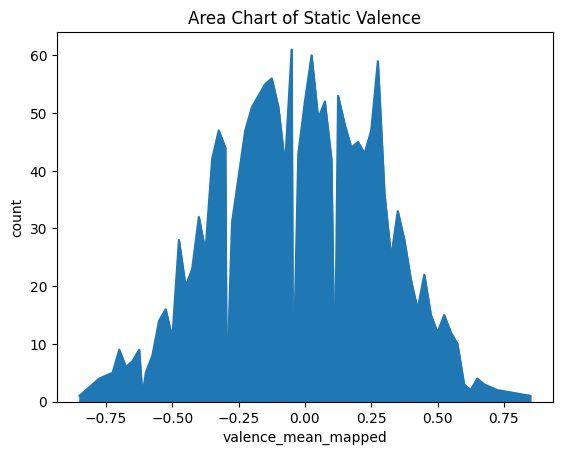

In [14]:
plot = df_deam_static_annotations['valence_mean_mapped'].value_counts().sort_index().plot.area()
plot.set_title("Area Chart of Static Valence")
plot.set_ylabel('count')

Text(0, 0.5, 'count')

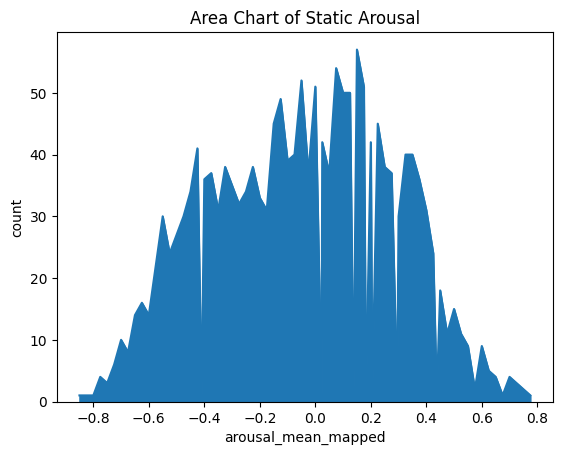

In [15]:
plot = df_deam_static_annotations['arousal_mean_mapped'].value_counts().sort_index().plot.area()
plot.set_title("Area Chart of Static Arousal")
plot.set_ylabel('count')

## Bivariate Analysis

#### openSMILE GeMAPS features with static valence and arousal

Combine static valence and aroussal with openSMILE GeMAPS featureset

In [16]:
df_deam_combined_opensmile_gemaps = pd.merge(df_deam_opensmile_gemaps_features, df_deam_static_annotations, on='song_id', how='inner')
df_deam_combined_opensmile_gemaps

,song_id,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,...,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,valence_mean,valence_std,arousal_mean,arousal_std,valence_mean_mapped,arousal_mean_mapped,class
0,2,22.932022,0.189338,19.655570,23.607199,24.485361,4.829792,124.252335,106.078514,60.294655,...,3.689382,0.037143,0.026573,3.1,0.94,3.0,0.63,-0.475,-0.500,3
1,3,16.164516,0.178617,14.101058,15.239481,18.985416,4.884358,85.965515,134.082820,62.976208,...,0.548327,0.104521,0.106012,3.5,1.75,3.3,1.62,-0.375,-0.425,3
2,4,22.580710,0.329062,16.054005,23.823282,24.116590,8.062586,299.053960,463.630200,163.715870,...,0.416942,0.054833,0.033689,5.7,1.42,5.5,1.63,0.175,0.125,1
3,5,29.905169,0.264543,22.387814,30.137478,37.959970,15.572155,179.485930,169.986390,111.476910,...,3.349172,0.038571,0.033987,4.4,2.01,5.3,1.85,-0.150,0.075,2
4,7,18.706436,0.172212,15.197102,18.928482,21.956436,6.759335,88.499120,122.277680,51.647667,...,3.186398,0.041667,0.039756,5.8,1.47,6.4,1.69,0.200,0.350,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,19.343260,0.212107,17.190958,19.071331,19.977148,2.786190,114.446846,127.966194,86.548430,...,1.089083,0.032593,0.018377,3.9,1.87,5.9,2.21,-0.275,0.225,2
1740,1997,22.913340,0.271282,18.283949,21.660767,26.187181,7.903233,220.857970,371.026340,115.580100,...,1.144158,0.043500,0.041021,5.3,1.42,3.9,1.14,0.075,-0.275,4
1741,1998,20.718222,0.323465,15.797006,19.021437,27.441607,11.644601,207.201580,221.265670,203.805970,...,0.482651,0.061154,0.043816,6.4,1.50,6.2,1.60,0.350,0.300,1
1742,1999,19.688591,0.249436,16.933563,19.086851,21.965055,5.031492,175.598650,295.851320,154.269360,...,0.316909,0.051875,0.039784,4.6,2.11,5.4,1.80,-0.100,0.100,2


Plot a heatmap to visualise the correlation between features in openSMILE GeMAPS features

<Axes: >

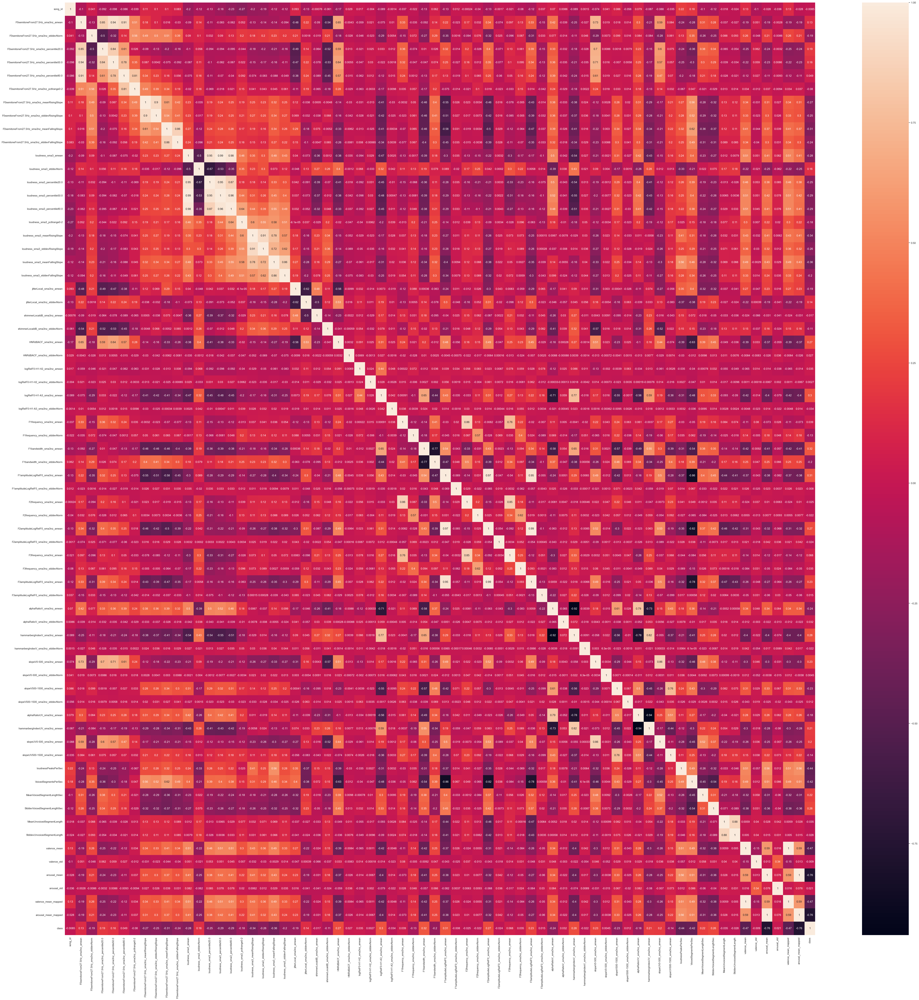

In [17]:
corr = df_deam_combined_opensmile_gemaps.corr(method='pearson')
sns.set_theme(rc={'figure.figsize': (72, 72)})
sns.heatmap(corr, annot=True)

In [18]:
# Features to exclude from the Static Annotation
exclude_features = [' valence_mean', ' valence_std', ' arousal_mean', ' arousal_std', 
                    'valence_mean_mapped', 'arousal_mean_mapped', 'class', 'song_id']

# Filter the correlation matrix to include only 'valence_mean_mapped' and 'arousal_mean_mapped'
corr_filtered = corr[['valence_mean_mapped', 'arousal_mean_mapped']]

In [19]:
# Get the top 3 correlation pairs with 'valence_mean_mapped' and 'arousal_mean_mapped' excluding specified features
top_correlations = (corr_filtered.drop(exclude_features)
                    .unstack()
                    .sort_values(ascending=False)
                    .reset_index()
                    .rename(columns={"level_0": "Static Annotation", "level_1": "Static Feature", 0: "correlation"})
                    .head(3))

# Display the top 3 correlation pairs
print(top_correlations)

     Static Annotation                Static Feature  correlation
0  arousal_mean_mapped           loudnessPeaksPerSec     0.559341
1  valence_mean_mapped  loudness_sma3_percentile80.0     0.512631
2  valence_mean_mapped  loudness_sma3_percentile50.0     0.511646


Now plot scatter plots to show the relationship between static valence and arousal, and the top 3 static features from openSMILE GeMAPS features with the highest correlation the static valence and arousal annotations

In [20]:
fig = px.scatter(df_deam_combined_opensmile_gemaps, x='valence_mean_mapped', y='arousal_mean_mapped', color='loudnessPeaksPerSec', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

In [21]:
fig = px.scatter(df_deam_combined_opensmile_gemaps, x='valence_mean_mapped', y='arousal_mean_mapped', color='loudness_sma3_percentile50.0', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

In [22]:
fig = px.scatter(df_deam_combined_opensmile_gemaps, x='valence_mean_mapped', y='arousal_mean_mapped', color='loudness_sma3_percentile50.0', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

In [23]:
# Get the bottom 3 correlation pairs with 'valence_mean_mapped' and 'arousal_mean_mapped' excluding specified features
bottom_correlations = (corr_filtered.drop(exclude_features)
                    .unstack()
                    .sort_values(ascending=False)
                    .reset_index()
                    .rename(columns={"level_0": "Static Annotation", "level_1": "Static Feature", 0: "correlation"})
                    .tail(3))

# Display the bottom 3 correlation pairs
print(bottom_correlations)

       Static Annotation               Static Feature  correlation
121  arousal_mean_mapped     F1bandwidth_sma3nz_amean    -0.409361
122  valence_mean_mapped     F1bandwidth_sma3nz_amean    -0.416130
123  valence_mean_mapped  logRelF0-H1-A3_sma3nz_amean    -0.424469


Now plot scatter plots to show the relationship between static valence and arousal, and the bottom 3 (2) static features from openSMILE GeMAPS features with the highest correlation the static valence and arousal annotations

In [24]:
fig = px.scatter(df_deam_combined_opensmile_gemaps, x='valence_mean_mapped', y='arousal_mean_mapped', color='F1bandwidth_sma3nz_amean', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

In [25]:
fig = px.scatter(df_deam_combined_opensmile_gemaps, x='valence_mean_mapped', y='arousal_mean_mapped', color='logRelF0-H1-A3_sma3nz_amean', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

#### openSMILE eGeMAPS features with static valence and arousal

Combine static valence and aroussal with openSMILE eGeMaps featureset

In [26]:
df_deam_combined_opensmile_egemaps = pd.merge(df_deam_opensmile_egemaps_features, df_deam_static_annotations, on='song_id', how='inner')
df_deam_combined_opensmile_egemaps

,song_id,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,...,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp,valence_mean,valence_std,arousal_mean,arousal_std,valence_mean_mapped,arousal_mean_mapped,class
0,2,22.932022,0.189338,19.655570,23.607199,24.485361,4.829792,124.252335,106.078514,60.294655,...,0.037143,0.026573,-19.159882,3.1,0.94,3.0,0.63,-0.475,-0.500,3
1,3,16.164516,0.178617,14.101058,15.239481,18.985416,4.884358,85.965515,134.082820,62.976208,...,0.104521,0.106012,-17.587570,3.5,1.75,3.3,1.62,-0.375,-0.425,3
2,4,22.580710,0.329062,16.054005,23.823282,24.116590,8.062586,299.053960,463.630200,163.715870,...,0.054833,0.033689,-14.016479,5.7,1.42,5.5,1.63,0.175,0.125,1
3,5,29.905169,0.264543,22.387814,30.137478,37.959970,15.572155,179.485930,169.986390,111.476910,...,0.038571,0.033987,-16.089987,4.4,2.01,5.3,1.85,-0.150,0.075,2
4,7,18.706436,0.172212,15.197102,18.928482,21.956436,6.759335,88.499120,122.277680,51.647667,...,0.041667,0.039756,-11.279402,5.8,1.47,6.4,1.69,0.200,0.350,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,19.343260,0.212107,17.190958,19.071331,19.977148,2.786190,114.446846,127.966194,86.548430,...,0.032593,0.018377,-17.564531,3.9,1.87,5.9,2.21,-0.275,0.225,2
1740,1997,22.913340,0.271282,18.283949,21.660767,26.187181,7.903233,220.857970,371.026340,115.580100,...,0.043500,0.041021,-21.888250,5.3,1.42,3.9,1.14,0.075,-0.275,4
1741,1998,20.718222,0.323465,15.797006,19.021437,27.441607,11.644601,207.201580,221.265670,203.805970,...,0.061154,0.043816,-18.990843,6.4,1.50,6.2,1.60,0.350,0.300,1
1742,1999,19.688591,0.249436,16.933563,19.086851,21.965055,5.031492,175.598650,295.851320,154.269360,...,0.051875,0.039784,-20.438614,4.6,2.11,5.4,1.80,-0.100,0.100,2


Plot a heatmap to visualise the correlation between features in openSMILE eGeMAPS features

<Axes: >

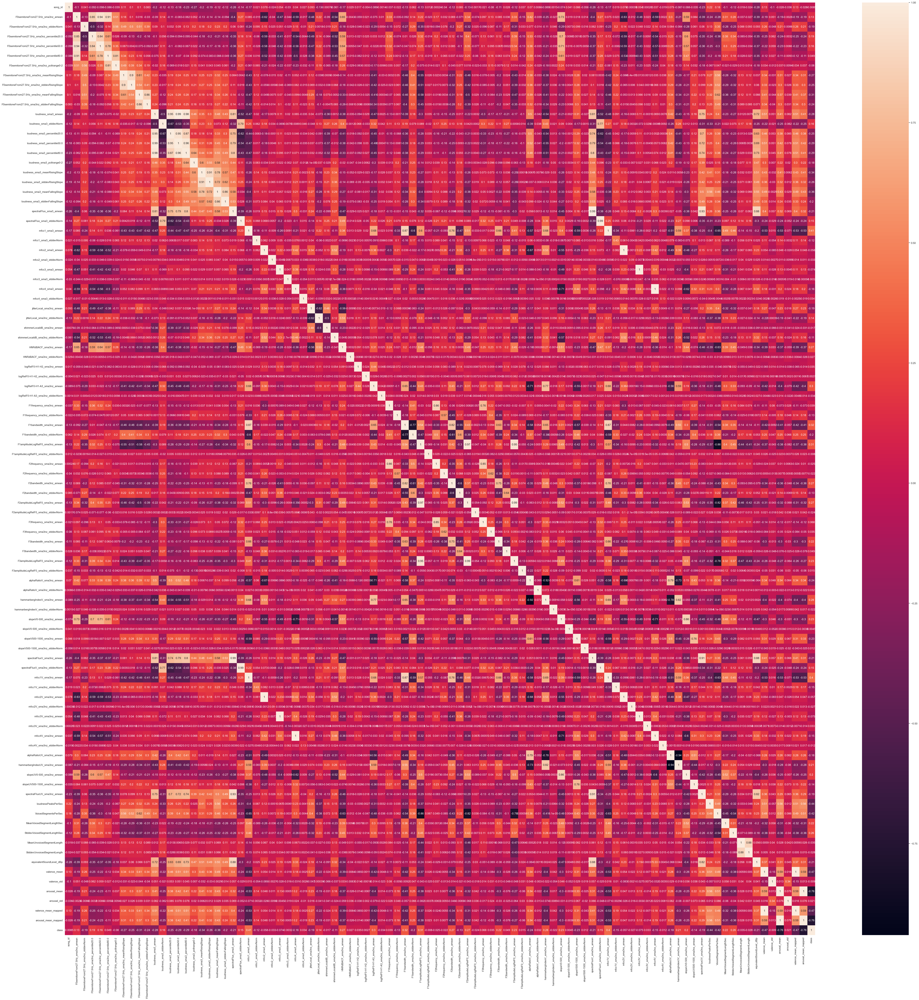

In [27]:
corr = df_deam_combined_opensmile_egemaps.corr(method='pearson')
sns.set_theme(rc={'figure.figsize': (72, 72)})
sns.heatmap(corr, annot=True)

In [28]:
# Features to exclude from the Static Annotation
exclude_features = [' valence_mean', ' valence_std', ' arousal_mean', ' arousal_std', 
                    'valence_mean_mapped', 'arousal_mean_mapped', 'class', 'song_id']

# Filter the correlation matrix to include only 'valence_mean_mapped' and 'arousal_mean_mapped'
corr_filtered = corr[['valence_mean_mapped', 'arousal_mean_mapped']]

In [29]:
# Get the top 3 correlation pairs with 'valence_mean_mapped' and 'arousal_mean_mapped' excluding specified features
top_correlations = (corr_filtered.drop(exclude_features)
                    .unstack()
                    .sort_values(ascending=False)
                    .reset_index()
                    .rename(columns={"level_0": "Static Annotation", "level_1": "Static Feature", 0: "correlation"})
                    .head(3))

# Display the top 3 correlation pairs
print(top_correlations)

     Static Annotation                Static Feature  correlation
0  arousal_mean_mapped           loudnessPeaksPerSec     0.559341
1  valence_mean_mapped  loudness_sma3_percentile80.0     0.512631
2  valence_mean_mapped  loudness_sma3_percentile50.0     0.511646


Sinece the correlations are the same as with the openSMILE GeMAPs featureset, there is no need to plot the scatter plots, since will yield similar results

In [30]:
# Get the bottom 3 correlation pairs with 'valence_mean_mapped' and 'arousal_mean_mapped' excluding specified features
bottom_correlations = (corr_filtered.drop(exclude_features)
                    .unstack()
                    .sort_values(ascending=False)
                    .reset_index()
                    .rename(columns={"level_0": "Static Annotation", "level_1": "Static Feature", 0: "correlation"})
                    .tail(3))

# Display the bottom 3 correlation pairs
print(bottom_correlations)

       Static Annotation       Static Feature  correlation
173  valence_mean_mapped  mfcc1V_sma3nz_amean    -0.528241
174  arousal_mean_mapped     mfcc1_sma3_amean    -0.528871
175  valence_mean_mapped     mfcc1_sma3_amean    -0.530431


Now plot scatter plots to show the relationship between static valence and arousal, and the bottom 3 (2) static features from openSMILE eGeMAPS features with the highest correlation the static valence and arousal annotations

In [31]:
fig = px.scatter(df_deam_combined_opensmile_egemaps, x='valence_mean_mapped', y='arousal_mean_mapped', color='mfcc1V_sma3nz_amean', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

In [32]:
fig = px.scatter(df_deam_combined_opensmile_egemaps, x='valence_mean_mapped', y='arousal_mean_mapped', color='mfcc1_sma3_amean', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

### openSMILE emobase, ComParE_2016 features are too big and impractical to plot correlation heatmaps out of (hundreds and thousands of features)

#### Essentia best overall features with static valence and arousal

Combine static valence and aroussal with Essentia best overall featureset

In [33]:
df_deam_combined_essentia_best_overall = pd.merge(df_deam_essentia_best_overall_features, df_deam_static_annotations, on='song_id', how='inner')
df_deam_combined_essentia_best_overall

,song_id,lowlevel.melbands_kurtosis.dmean,lowlevel.melbands_kurtosis.dmean2,lowlevel.melbands_kurtosis.dvar,lowlevel.melbands_kurtosis.dvar2,lowlevel.melbands_kurtosis.max,lowlevel.melbands_kurtosis.mean,lowlevel.melbands_kurtosis.median,lowlevel.melbands_kurtosis.min,lowlevel.melbands_kurtosis.stdev,...,tonal.key_edma.strength,tonal.key_temperley.strength,tonal.chords_histogram,valence_mean,valence_std,arousal_mean,arousal_std,valence_mean_mapped,arousal_mean_mapped,class
0,2,9.415085,14.939523,309.038300,742.725952,328.973969,21.801605,11.508560,-1.316976,37.293823,...,0.654566,0.632045,[34.25926 3.7037036 4.1152263 1.851851...,3.1,0.94,3.0,0.63,-0.475,-0.500,3
1,3,17.002226,26.332752,547.728210,1229.172241,471.216980,76.052628,62.377014,-1.212672,54.853020,...,0.691578,0.691432,[ 8.238929 16.065912 31.92585 7.929969...,3.5,1.75,3.3,1.62,-0.375,-0.425,3
2,4,8.181362,12.390743,164.146927,348.634216,182.409042,16.516722,11.165314,-1.461427,19.692038,...,0.631611,0.616269,[79.71164 2.2657053 0.6179197 0. ...,5.7,1.42,5.5,1.63,0.175,0.125,1
3,5,6.160454,9.577818,82.103508,203.349884,131.002609,14.615296,9.967463,-1.718094,15.931263,...,0.852302,0.847586,[67.25026 1.0298661 14.624099 0. ...,4.4,2.01,5.3,1.85,-0.150,0.075,2
4,7,46.677437,67.838478,2727.447998,6007.274902,635.005981,99.851807,80.275414,-1.255423,84.649658,...,0.528712,0.518792,[12.962963 0.5144033 45.37037 6.481481...,5.8,1.47,6.4,1.69,0.200,0.350,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1739,1996,6.549002,10.465438,90.671638,229.975418,102.836098,12.534721,10.126063,-1.418290,11.308396,...,0.759683,0.756458,[59.381443 18.556702 0. 0. ...,3.9,1.87,5.9,2.21,-0.275,0.225,2
1740,1997,5.866978,9.743977,73.712753,198.091965,95.177231,11.646033,7.612457,-1.583036,12.044659,...,0.600971,0.620554,[12.886598 16.28866 15.463918 1.030927...,5.3,1.42,3.9,1.14,0.075,-0.275,4
1741,1998,8.790737,14.096998,345.523193,891.726868,402.426819,15.330372,10.513874,-1.687109,19.856863,...,0.724135,0.737769,[29.484535 0. 6.2886596 0. ...,6.4,1.50,6.2,1.60,0.350,0.300,1
1742,1999,7.967627,12.597425,119.048744,285.454956,249.734558,20.406567,17.666672,-0.742111,17.207710,...,0.685962,0.707858,[ 0. 0. 0. 0. ...,4.6,2.11,5.4,1.80,-0.100,0.100,2


Plot a heatmap to visualise the correlation between features in Essentia best overall features

<Axes: >

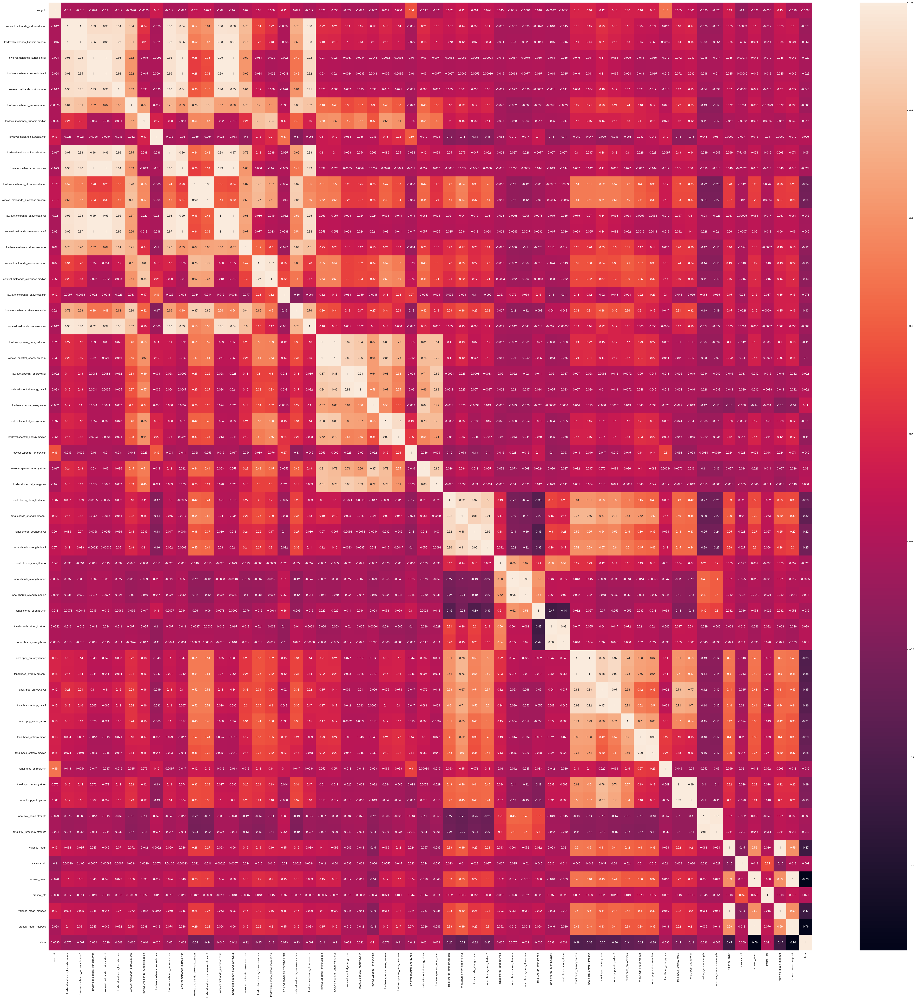

In [34]:
# some of the features do not contain numeric data
corr = df_deam_combined_essentia_best_overall.select_dtypes(include=np.number).corr(method='pearson')

sns.set_theme(rc={'figure.figsize': (72, 72)})
sns.heatmap(corr, annot=True)

In [35]:
# Features to exclude from the Static Annotation
exclude_features = [' valence_mean', ' valence_std', ' arousal_mean', ' arousal_std', 
                    'valence_mean_mapped', 'arousal_mean_mapped', 'class', 'song_id']

# Filter the correlation matrix to include only 'valence_mean_mapped' and 'arousal_mean_mapped'
corr_filtered = corr[['valence_mean_mapped', 'arousal_mean_mapped']]

In [36]:
# Get the top 3 correlation pairs with 'valence_mean_mapped' and 'arousal_mean_mapped' excluding specified features
top_correlations = (corr_filtered.drop(exclude_features)
                    .unstack()
                    .sort_values(ascending=False)
                    .reset_index()
                    .rename(columns={"level_0": "Static Annotation", "level_1": "Static Feature", 0: "correlation"})
                    .head(3))

# Display the top 3 correlation pairs
print(top_correlations)

     Static Annotation             Static Feature  correlation
0  valence_mean_mapped   tonal.hpcp_entropy.dmean     0.503883
1  valence_mean_mapped  tonal.hpcp_entropy.dmean2     0.495105
2  arousal_mean_mapped   tonal.hpcp_entropy.dmean     0.491084


Now plot scatter plots to show the relationship between static valence and arousal, and the top 3 (2) static features from Essentia best overall features with the highest correlation the static valence and arousal annotations

In [37]:
fig = px.scatter(df_deam_combined_essentia_best_overall, x='valence_mean_mapped', y='arousal_mean_mapped', color='tonal.hpcp_entropy.dmean', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

In [38]:
fig = px.scatter(df_deam_combined_essentia_best_overall, x='valence_mean_mapped', y='arousal_mean_mapped', color='tonal.hpcp_entropy.dmean2', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

In [39]:
# Get the bottom 3 correlation pairs with 'valence_mean_mapped' and 'arousal_mean_mapped' excluding specified features
bottom_correlations = (corr_filtered.drop(exclude_features)
                    .unstack()
                    .sort_values(ascending=False)
                    .reset_index()
                    .rename(columns={"level_0": "Static Annotation", "level_1": "Static Feature", 0: "correlation"})
                    .tail(3))

# Display the bottom 3 correlation pairs
print(bottom_correlations)

       Static Annotation                Static Feature  correlation
101  valence_mean_mapped  lowlevel.spectral_energy.var    -0.084921
102  arousal_mean_mapped  lowlevel.spectral_energy.max    -0.136100
103  valence_mean_mapped  lowlevel.spectral_energy.max    -0.156826


Now plot scatter plots to show the relationship between static valence and arousal, and the bottom 3 (2) static features from Essentia best overall features with the highest correlation the static valence and arousal annotations

In [40]:
fig = px.scatter(df_deam_combined_essentia_best_overall, x='valence_mean_mapped', y='arousal_mean_mapped', color='lowlevel.spectral_energy.var', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 

In [41]:
fig = px.scatter(df_deam_combined_essentia_best_overall, x='valence_mean_mapped', y='arousal_mean_mapped', color='lowlevel.spectral_energy.max', color_continuous_scale='turbo', width=800, height=600) 
fig.show() 